<a href="https://colab.research.google.com/github/vdtheone1/dhemanth/blob/master/corona_dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
% matplotlib inline

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [2]:
df_data1=pd.read_csv('/content/drive/My Drive/Assignment - Data Science/07-12-2020.csv')
df_data2=pd.read_csv('/content/drive/My Drive/Assignment - Data Science/csse_daily.csv')
df_data3=pd.read_csv('/content/drive/My Drive/Assignment - Data Science/time_series_covid19_confirmed_global.csv')
df_data4=pd.read_csv('/content/drive/My Drive/Assignment - Data Science/time_series_covid19_deaths_global.csv')
df_data5=pd.read_csv('/content/drive/My Drive/Assignment - Data Science/time_series_covid19_recovered_global.csv')

In [3]:
df_data2.fillna(0,inplace=True)
df_data2.head()


,FIPS,Admin2,Province_State,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,Combined_Key,Incidence_Rate,Case-Fatality_Ratio
0,45001.0,Abbeville,South Carolina,US,2020-07-13 04:43:04,34.223334,-82.461707,153,1,0,152.0,"Abbeville, South Carolina, US",623.802340,0.653595
1,22001.0,Acadia,Louisiana,US,2020-07-13 04:43:04,30.295065,-92.414197,1339,45,0,1294.0,"Acadia, Louisiana, US",2158.111048,3.360717
2,51001.0,Accomack,Virginia,US,2020-07-13 04:43:04,37.767072,-75.632346,1042,14,0,1028.0,"Accomack, Virginia, US",3224.408962,1.343570
3,16001.0,Ada,Idaho,US,2020-07-13 04:43:04,43.452658,-116.241552,4146,25,0,4121.0,"Ada, Idaho, US",860.903637,0.602991
4,19001.0,Adair,Iowa,US,2020-07-13 04:43:04,41.330756,-94.471059,17,0,0,17.0,"Adair, Iowa, US",237.695749,0.000000


In [ ]:
df_data2['mortality_rate']=df_data2.apply(lambda x: 0 if x['Confirmed']==0 else np.round(((x['Deaths']/(x['Confirmed']+1.01))*10),2) ,axis=1)
df_data2['recovery_rate']=df_data2.apply(lambda x: 0 if x['Confirmed']==0 else np.round(((x['Recovered']/(x['Confirmed']+1.01))*10),2) ,axis=1)

# overall scenario in the world

In [ ]:
data_us=pd.DataFrame(df_data2[['Deaths','Recovered','Active','Incidence_Rate']].sum()).transpose()
#data_us['Case-Fatality_Ratio']=df_data2['Case-Fatality_Ratio'].mean()
data_us['mortality_rate']=df_data2['mortality_rate'].mean()
data_us['recovery_rate']=df_data2['recovery_rate'].mean()
data_us.style.background_gradient(cmap='Wistia',axis=1).format("{:.2f}")

,Deaths,Recovered,Active,Incidence_Rate,mortality_rate,recovery_rate
0,569128.00,7116957.00,5269635.00,2238139.53,0.32,1.14


# top 10 countries with high corona cases

In [8]:
import plotly.express as px
df_grouped=df_data2.groupby(by='Country_Region').sum()
df_top10_confirmed=df_grouped.sort_values(by=['Confirmed'],ascending=False)[:10]
fig = px.bar(df_top10_confirmed,x='Confirmed', y=df_top10_confirmed.index,orientation='h',title='Top 10 countries with confirmed cases',color_discrete_sequence=["orange"])
fig.show()


In [ ]:
df_top10_deaths=df_grouped.sort_values(by=['Deaths'],ascending=False)[:10]
fig = px.bar(df_top10_deaths,x='Deaths', y=df_top10_deaths.index,orientation='h',title='Top 10 countries with Deaths',color_discrete_sequence=["maroon"])
fig.show()

In [ ]:
df_top10_Recovered=df_grouped.sort_values(by=['Recovered'],ascending=False)[:10]
fig = px.bar(df_top10_Recovered,x='Recovered', y=df_top10_Recovered.index,orientation='h',title='Top 10 countries with Recovered',color_discrete_sequence=["green"])
fig.show()

In [ ]:
df_top10_Active=df_grouped.sort_values(by=['Active'],ascending=False)[:10]
fig = px.bar(df_top10_Active,x='Active', y=df_top10_Active.index,orientation='h',title='Top 10 countries with Recovered',color_discrete_sequence=["purple"])
fig.show()

In [ ]:
df_top10_Active=df_grouped.sort_values(by=['recovery_rate'],ascending=False)[:10]
fig = px.bar(df_top10_Active,x='recovery_rate', y=df_top10_Active.index,orientation='h',title='Top 10 countries with recovery_rate',color_discrete_sequence=["orange"])
fig.show()

In [ ]:
df_top10_Active=df_grouped.sort_values(by=['mortality_rate'],ascending=False)[:10]
fig = px.bar(df_top10_Active,x='mortality_rate', y=df_top10_Active.index,orientation='h',title='Top 10 countries with mortality_rate',color_discrete_sequence=["gray"])
fig.show()

#Correlation

In [ ]:
df_corr=df_data2[['Confirmed'	,'Deaths'	,'Recovered',	'Active','Incidence_Rate'	]]
df_corr.corr().style.background_gradient(cmap='Pastel2_r',axis=1).format("{:.2f}")

,Confirmed,Deaths,Recovered,Active,Incidence_Rate
Confirmed,1.00,0.74,0.47,0.39,0.08
Deaths,0.74,1.00,0.27,0.34,0.04
Recovered,0.47,0.27,1.00,-0.63,0.03
Active,0.39,0.34,-0.63,1.00,0.12
Incidence_Rate,0.08,0.04,0.03,0.12,1.00


In [ ]:
dropping3=df_data3.drop(['Province/State','Country/Region','Lat','Long'],axis=1).transpose()
confirmed_count=pd.DataFrame(dropping3.sum(axis=1),columns=['count'])
confirmed_count.index=pd.to_datetime(confirmed_count.index)


dropping5=df_data5.drop(['Province/State','Country/Region','Lat','Long'],axis=1).transpose()
recovery_count=pd.DataFrame(dropping5.sum(axis=1),columns=['count'])
recovery_count.index=pd.to_datetime(recovery_count.index)

dropping4=df_data4.drop(['Province/State','Country/Region','Lat','Long'],axis=1).transpose()
death_count=pd.DataFrame(dropping4.sum(axis=1),columns=['count'])
death_count.index=pd.to_datetime(death_count.index)




fig = go.Figure()
fig.add_trace(go.Scatter(x=death_count.index,y=death_count['count'],fill='tozeroy',name="death"))
fig.add_trace(go.Scatter(x=confirmed_count.index,y=confirmed_count['count'],fill='tozeroy',name="Confirmed_cases"))
fig.add_trace(go.Scatter(x=recovery_count.index,y=recovery_count['count'],fill='tozeroy',name="recovery_cases"))
fig.update_traces(mode='markers', marker_line_width=2, marker_size=5)
fig.update_layout(title='<b>World wide death, recovery and confirmed cases of corona from Jan 2020 till july 2020 </b>',
                  yaxis_zeroline=False, xaxis_zeroline=False)

fig.show()

In [ ]:
dropping=df_data3.drop(['Province/State','Country/Region','Lat','Long'],axis=1).transpose()
_count=pd.DataFrame(dropping.sum(axis=1),columns=['count'])
confirmed_count.index=pd.to_datetime(confirmed_count.index)
fig = go.Figure()
fig.add_trace(go.Scatter(x=count.index,y=count['count'],fill='tozeroy',name="death"))
fig.add_trace(go.Scatter(x=confirmed_count.index,y=confirmed_count['count'],fill='tozeroy',name="Confirmed_cases"))
fig.add_trace(go.Scatter(x=recovery_count.index,y=recovery_count['count'],fill='tozeroy',name="recovery_cases"))
fig.update_traces(mode='markers', marker_line_width=2, marker_size=5)
fig.update_layout(title='<b>World wide death, recovery and confirmed cases of corona from Jan 2020 till july 2020 using log scale</b>',
                  yaxis_zeroline=False, xaxis_zeroline=False,yaxis_type="log")

fig.show()

# *Country  specific  Cases, death, recoveries graph*

In [ ]:
country_death=df_grouped.sort_values(by=['Confirmed'],ascending=False)
fig = px.bar(country_death,y='Confirmed', x=country_death.index,orientation='v',title='Countries with Confirmed corona cases count',color_discrete_sequence=["teal"])
fig.show()

In [ ]:
country_death=df_grouped.sort_values(by=['Recovered'],ascending=False)
fig = px.bar(country_death,y='Recovered', x=country_death.index,orientation='v',title='Countries with Recovered count',color_discrete_sequence=["gray"])
fig.show()

In [ ]:
country_death=df_grouped.sort_values(by=['Deaths'],ascending=False)
fig = px.bar(country_death,y='Deaths', x=country_death.index,orientation='v',title='Countries with Deaths count',color_discrete_sequence=["red"])
fig.show()

# Country specific Cases, death, recoveries graph day wise

In [ ]:
fig = px.scatter_mapbox(df_data2, lat="Lat", lon="Long_", hover_name="Country_Region", hover_data=['Province_State',"Confirmed"],color="Confirmed",
                         color_continuous_scale =px.colors.diverging.Portland,  zoom=3, height=700,title ='<b>Confirmed corona cases across the world<b>')
fig.update_layout(mapbox_style="open-street-map")
#fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()
#color="Confirmed",

In [ ]:
fig = px.scatter_mapbox(df_data2, lat="Lat", lon="Long_", hover_name="Country_Region", hover_data=['Province_State',"Recovered"],color="Recovered",
                         color_continuous_scale =px.colors.diverging.PiYG,  zoom=3, height=700,title ='<b> Recovered cases across the world<b>')
fig.update_layout(mapbox_style="open-street-map")

fig.show()


In [ ]:
fig = px.scatter_mapbox(df_data2, lat="Lat", lon="Long_", hover_name="Country_Region", hover_data=['Province_State',"Deaths"],color="Deaths",
                         color_continuous_scale =px.colors.sequential.Rainbow_r,  zoom=3, height=700,title ='<b> Corona Deaths cases across the world<b>')
fig.update_layout(mapbox_style="open-street-map")

fig.show()


In [ ]:
df_geoplot=df_data3.groupby(['Country/Region']).sum()
df_geoplot.drop(['Lat','Long'],axis=1,inplace=True)
df_geoplot['Lat']=df_data3.groupby(['Country/Region']).mean()['Lat']
df_geoplot['Long']=df_data3.groupby(['Country/Region']).mean()['Long']
df_geoplot.reset_index(inplace=True)

In [ ]:
df_geoplot=df_geoplot[['Country/Region',
 'Lat',
 'Long',
 '1/22/20',
 '1/23/20',
 '1/24/20',
 '1/25/20',
 '1/26/20',
 '1/27/20',
 '1/28/20',
 '1/29/20',
 '1/30/20',
 '1/31/20',
 '2/1/20',
 '2/2/20',
 '2/3/20',
 '2/4/20',
 '2/5/20',
 '2/6/20',
 '2/7/20',
 '2/8/20',
 '2/9/20',
 '2/10/20',
 '2/11/20',
 '2/12/20',
 '2/13/20',
 '2/14/20',
 '2/15/20',
 '2/16/20',
 '2/17/20',
 '2/18/20',
 '2/19/20',
 '2/20/20',
 '2/21/20',
 '2/22/20',
 '2/23/20',
 '2/24/20',
 '2/25/20',
 '2/26/20',
 '2/27/20',
 '2/28/20',
 '2/29/20',
 '3/1/20',
 '3/2/20',
 '3/3/20',
 '3/4/20',
 '3/5/20',
 '3/6/20',
 '3/7/20',
 '3/8/20',
 '3/9/20',
 '3/10/20',
 '3/11/20',
 '3/12/20',
 '3/13/20',
 '3/14/20',
 '3/15/20',
 '3/16/20',
 '3/17/20',
 '3/18/20',
 '3/19/20',
 '3/20/20',
 '3/21/20',
 '3/22/20',
 '3/23/20',
 '3/24/20',
 '3/25/20',
 '3/26/20',
 '3/27/20',
 '3/28/20',
 '3/29/20',
 '3/30/20',
 '3/31/20',
 '4/1/20',
 '4/2/20',
 '4/3/20',
 '4/4/20',
 '4/5/20',
 '4/6/20',
 '4/7/20',
 '4/8/20',
 '4/9/20',
 '4/10/20',
 '4/11/20',
 '4/12/20',
 '4/13/20',
 '4/14/20',
 '4/15/20',
 '4/16/20',
 '4/17/20',
 '4/18/20',
 '4/19/20',
 '4/20/20',
 '4/21/20',
 '4/22/20',
 '4/23/20',
 '4/24/20',
 '4/25/20',
 '4/26/20',
 '4/27/20',
 '4/28/20',
 '4/29/20',
 '4/30/20',
 '5/1/20',
 '5/2/20',
 '5/3/20',
 '5/4/20',
 '5/5/20',
 '5/6/20',
 '5/7/20',
 '5/8/20',
 '5/9/20',
 '5/10/20',
 '5/11/20',
 '5/12/20',
 '5/13/20',
 '5/14/20',
 '5/15/20',
 '5/16/20',
 '5/17/20',
 '5/18/20',
 '5/19/20',
 '5/20/20',
 '5/21/20',
 '5/22/20',
 '5/23/20',
 '5/24/20',
 '5/25/20',
 '5/26/20',
 '5/27/20',
 '5/28/20',
 '5/29/20',
 '5/30/20',
 '5/31/20',
 '6/1/20',
 '6/2/20',
 '6/3/20',
 '6/4/20',
 '6/5/20',
 '6/6/20',
 '6/7/20',
 '6/8/20',
 '6/9/20',
 '6/10/20',
 '6/11/20',
 '6/12/20',
 '6/13/20',
 '6/14/20',
 '6/15/20',
 '6/16/20',
 '6/17/20',
 '6/18/20',
 '6/19/20',
 '6/20/20',
 '6/21/20',
 '6/22/20',
 '6/23/20',
 '6/24/20',
 '6/25/20',
 '6/26/20',
 '6/27/20',
 '6/28/20',
 '6/29/20',
 '6/30/20',
 '7/1/20',
 '7/2/20',
 '7/3/20',
 '7/4/20',
 '7/5/20',
 '7/6/20',
 '7/7/20',
 '7/8/20',
 '7/9/20',
 '7/10/20',
 '7/11/20',
 '7/12/20',
 '7/13/20',
 ]]

In [ ]:
min_cases=1000
df_geoplot = df_geoplot[df_geoplot.iloc[:, 3:].max(axis=1) > min_cases]
print(df_geoplot.shape)

(138, 177)


In [ ]:
df_geoplot_long = pd.melt(df_geoplot,
                                   id_vars=df_geoplot.iloc[:, :3],
                                   var_name='date',
                                   value_vars=df_geoplot.iloc[:, 3:],
                                   value_name='date_confirmed_cases')

In [ ]:
df_geoplot_long.head()

,Country/Region,Lat,Long,date,date_confirmed_cases
0,Afghanistan,33.93911,67.709953,1/22/20,0
1,Albania,41.15330,20.168300,1/22/20,0
2,Algeria,28.03390,1.659600,1/22/20,0
3,Argentina,-38.41610,-63.616700,1/22/20,0
4,Armenia,40.06910,45.038200,1/22/20,0


In [ ]:
from plotly.offline import plot
fig = px.scatter_geo(df_geoplot_long,
                     lat="Lat", lon="Long", color="Country/Region",
                     hover_name="Country/Region", size="date_confirmed_cases",
                     size_max=50, animation_frame="date",
                     template='plotly_dark', projection="natural earth",
                     title="COVID-19 worldwide confirmed cases over time")

fig.show()

#Countrywise confirmed cases

In [ ]:
countrywise_group.head()

Country/Region,Afghanistan,Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Australia,Austria,Azerbaijan,Bahamas,Bahrain,Bangladesh,Barbados,Belarus,Belgium,Belize,Benin,Bhutan,Bolivia,Bosnia and Herzegovina,Botswana,Brazil,Brunei,Bulgaria,Burkina Faso,Burma,Burundi,Cabo Verde,Cambodia,Cameroon,Canada,Central African Republic,Chad,Chile,China,Colombia,Comoros,Congo (Brazzaville),...,Senegal,Serbia,Seychelles,Sierra Leone,Singapore,Slovakia,Slovenia,Somalia,South Africa,South Sudan,Spain,Sri Lanka,Sudan,Suriname,Sweden,Switzerland,Syria,Taiwan*,Tajikistan,Tanzania,Thailand,Timor-Leste,Togo,Trinidad and Tobago,Tunisia,Turkey,US,Uganda,Ukraine,United Arab Emirates,United Kingdom,Uruguay,Uzbekistan,Venezuela,Vietnam,West Bank and Gaza,Western Sahara,Yemen,Zambia,Zimbabwe
2020-01-22,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,548.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-01-23,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,643.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0
2020-01-24,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,920.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0
2020-01-25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1406.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,7.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0
2020-01-26,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,2075.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,8.0,0.0,0.0,0.0,0.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
countrywise_group=df_data3.groupby(['Country/Region']).sum().transpose()
countrywise_group.drop(['Lat','Long'],inplace=True)
countrywise_group.index=pd.to_datetime(countrywise_group.index)

fig = go.Figure()
for i in countrywise_group.columns:
  fig.add_trace(go.Scatter(x=countrywise_group.index,y=countrywise_group[i],name=i,mode='lines+markers',connectgaps=True,fill='tonexty'))
  

fig.update_layout(title='<b>Countrywise confirmed cases over time</b>',
                  yaxis_zeroline=False, xaxis_zeroline=False,showlegend=True)
fig.show()


In [ ]:
countrywise_group_death=df_data4.groupby(['Country/Region']).sum().transpose()
countrywise_group_death.drop(['Lat','Long'],inplace=True)
countrywise_group_death.index=pd.to_datetime(countrywise_group_death.index)

fig = go.Figure()
for i in countrywise_group_death.columns:
  fig.add_trace(go.Scatter(x=countrywise_group_death.index,y=countrywise_group_death[i],name=i,mode='lines+markers',connectgaps=True,fill='tonexty'))
  

fig.update_layout(title='<b>Countrywise death over time</b>',
                  yaxis_zeroline=False, xaxis_zeroline=False,showlegend=True)
fig.show()


In [ ]:
countrywise_group_recovery=df_data4.groupby(['Country/Region']).sum().transpose()
countrywise_group_recovery.drop(['Lat','Long'],inplace=True)
countrywise_group_recovery.index=pd.to_datetime(countrywise_group_recovery.index)

fig = go.Figure()
for i in countrywise_group_recovery.columns:
  fig.add_trace(go.Scatter(x=countrywise_group_recovery.index,y=countrywise_group_recovery[i],name=i,mode='lines+markers',connectgaps=True,fill='tonexty'))
  

fig.update_layout(title='<b>Countrywise recovery over time</b>',
                  yaxis_zeroline=False, xaxis_zeroline=False,showlegend=True)
fig.show()

# world wide confirmed vs death check

In [ ]:
fig = px.scatter(df_data2.sort_values('Deaths', ascending=False).iloc[:20, :], 
                 x='Confirmed', y='Deaths', color='Country_Region', size='Confirmed', 
                 height=700, text='Country_Region', log_x=False, log_y=False, 
                 title='Deaths vs Confirmed' )
fig.update_traces(textposition='top center')
fig.update_layout(showlegend=False)
fig.update_layout(xaxis_rangeslider_visible=True)
fig.show()

In [ ]:
fig = px.scatter(df_data2.sort_values('Recovered', ascending=False).iloc[:20, :], 
                 x='Confirmed', y='Recovered', color='Country_Region', size='Confirmed', 
                 height=700, text='Country_Region', log_x=False, log_y=False, 
                 title='Deaths vs Recovered' )
fig.update_traces(textposition='top center')
fig.update_layout(showlegend=False)
fig.update_layout(xaxis_rangeslider_visible=True)
fig.show()

# Trend of corona (china vs other countries)

In [ ]:

other_countries=pd.DataFrame(countrywise_group.drop(['China'],axis=1).sum(axis=1),columns=['count'])
fig = go.Figure()

fig.add_trace(go.Scatter(
    x=other_countries.index,
    y=np.log(other_countries['count']),
    name="other_countries",
    mode='lines'

))


fig.add_trace(go.Scatter(
    x=countrywise_group.index,
    y=np.log(countrywise_group['China']),
    name="china",
    
))

fig.update_layout(title='<b>china vs other countries(confirmed cases) in log scale</b>',
                  yaxis_zeroline=False, xaxis_zeroline=False,showlegend=True)
fig.show()


In [ ]:
other_countries_deaths=pd.DataFrame(countrywise_group_death.drop(['China'],axis=1).sum(axis=1),columns=['count'])

fig = go.Figure()

fig.add_trace(go.Scatter(
    x=other_countries_deaths.index,
    y=np.log((other_countries_deaths['count'])+1),
    name="other_countries",
    mode='lines'

))


fig.add_trace(go.Scatter(
    x=countrywise_group_death.index,
    y=np.log((countrywise_group_death['China'])+1),
    name="china",
    
))

fig.update_layout(title='<b>china vs other countries(death cases) in log scale</b>',
                  yaxis_zeroline=False, xaxis_zeroline=False,showlegend=True)
fig.show()

# covid scenario in USA

In [ ]:
data_usa=pd.DataFrame(df_data1[['Deaths','Recovered','Active','Incident_Rate']].sum()).transpose()
#data_us['Case-Fatality_Ratio']=df_data2['Case-Fatality_Ratio'].mean()
data_usa['Mortality_Rate']=df_data1['Mortality_Rate'].mean()
data_usa['Hospitalization_Rate']=df_data1['Hospitalization_Rate'].mean()
#data_usa['recovery_rate']=df_data2['recovery_rate'].mean()
data_usa.style.background_gradient(cmap='GnBu',axis=1).format("{:.2f}")

,Deaths,Recovered,Active,Incident_Rate,Mortality_Rate,Hospitalization_Rate
0,135205.00,1006326.00,2163411.00,45474.94,3.32,10.64


# monthly change in corona cases

In [ ]:
df_month=df_data3[df_data3['Country/Region']=='US'].transpose().drop(['Lat','Long','Province/State','Country/Region'])
df_month.index=pd.to_datetime(df_month.index).month
df_month=df_month.groupby(df_month.index).sum()
months = ["Unknown",
          "January",
          "Febuary",
          "March",
          "April",
          "May",
          "June",
          "July",
          "August",
          "September",
          "October",
          "November",
          "December"]
df_month.index=df_month.index.map(lambda x: months[x])
df_month.columns=['count']
fig = px.bar(df_month,x=df_month.index, y='count',orientation='v',title='<b>month-wise confirmed cases of corona in US<b>',color_discrete_sequence=["orange"])
fig.show()

In [ ]:
df_month_death=df_data4[df_data4['Country/Region']=='US'].transpose().drop(['Lat','Long','Province/State','Country/Region'])
df_month_death.index=pd.to_datetime(df_month_death.index).month
df_month_death=df_month_death.groupby(df_month_death.index).sum()
df_month_death.index=df_month_death.index.map(lambda x: months[x])
df_month_death.columns=['count']
fig = px.bar(df_month_death,x=df_month_death.index, y='count',orientation='v',title='<b>month-wise death cases of corona in US<b>',color_discrete_sequence=["brown"])
fig.show()

In [ ]:
df_month_recovery=df_data5[df_data5['Country/Region']=='US'].transpose().drop(['Lat','Long','Province/State','Country/Region'])
df_month_recovery.index=pd.to_datetime(df_month_recovery.index).month
df_month_recovery=df_month_recovery.groupby(df_month_recovery.index).sum()
df_month_recovery.index=df_month_recovery.index.map(lambda x: months[x])
df_month_recovery.columns=['count']
fig = px.bar(df_month_recovery,x=df_month_recovery.index, y='count',orientation='v',title='<b>month-wise recovery cases of corona in US<b>',color_discrete_sequence=["green"])
fig.show()

In [ ]:
codes=pd.read_excel('/content/drive/My Drive/codes.xlsx')

In [ ]:
df_data1['codes']=codes['Unnamed: 1']

In [ ]:
df_data1.head(1)

,Province_State,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,FIPS,Incident_Rate,People_Tested,People_Hospitalized,Mortality_Rate,UID,ISO3,Testing_Rate,Hospitalization_Rate,codes
0,Alabama,US,2020-07-13 04:43:16,32.3182,-86.9023,53587,1121,25783.0,26683.0,1,1092.901859,511506.0,6745.0,2.091925,84000001,USA,10432.117083,12.587008,AL


In [ ]:
import plotly.graph_objects as go
fig = go.Figure(data=go.Choropleth(
    locations=df_data1['codes'], # Spatial coordinates
    z = df_data1['Confirmed'].astype(float), # Data to be color-coded
    locationmode = 'USA-states', # set of locations match entries in `locations`
    colorscale = 'Viridis',
    colorbar_title = "votesRep",
))

fig.update_layout(
    title_text = '<b>corona confirmed cases in US<b>',
    geo_scope='usa', # limite map scope to USA
)

fig.show()

In [ ]:
import plotly.graph_objects as go
fig = go.Figure(data=go.Choropleth(
    locations=df_data1['codes'], # Spatial coordinates
    z = df_data1['Deaths'].astype(float), # Data to be color-coded
    locationmode = 'USA-states', # set of locations match entries in `locations`
    colorscale = 'Viridis',
    colorbar_title = "votesRep",
))

fig.update_layout(
    title_text = '<b> Deaths in US due to corona<b>',
    geo_scope='usa', # limite map scope to USA
)

fig.show()

In [ ]:
import plotly.graph_objects as go
fig = go.Figure(data=go.Choropleth(
    locations=df_data1['codes'], # Spatial coordinates
    z = df_data1['Recovered'].astype(float), # Data to be color-coded
    locationmode = 'USA-states', # set of locations match entries in `locations`
    colorscale = 'Viridis',
    colorbar_title = "votesRep",
))

fig.update_layout(
    title_text = '<b> Recovery in US from corona<b>',
    geo_scope='usa', # limite map scope to USA
)

fig.show()

In [ ]:
import plotly.graph_objects as go
fig = go.Figure(data=go.Choropleth(
    locations=df_data1['codes'], # Spatial coordinates
    z = df_data1['Active'].astype(float), # Data to be color-coded
    locationmode = 'USA-states', # set of locations match entries in `locations`
    colorscale = 'Viridis',
    colorbar_title = "votesRep",
))

fig.update_layout(
    title_text = '<b> US corona active casese<b>',
    geo_scope='usa', # limite map scope to USA
)

fig.show()

# India scenario

In [ ]:
data_india=df_data2[df_data2['Country_Region']=='India']
data_india_case=pd.DataFrame(data_india[['Confirmed','Deaths','Recovered','Active']].sum()).transpose()
#data_usa['recovery_rate']=df_data2['recovery_rate'].mean()
data_india_case.style.background_gradient(cmap='GnBu',axis=1).format("{:.2f}")

,Confirmed,Deaths,Recovered,Active
0,878254.00,23174.00,553471.00,301609.00


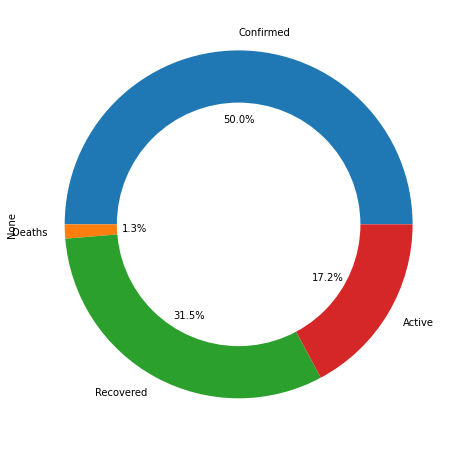

In [ ]:
data_india[['Confirmed','Deaths','Recovered','Active']]\
    .sum()\
    .plot(kind='pie', subplots=True, figsize=(8, 8), autopct='%1.1f%%')

fig = plt.gcf()

fig.gca().add_artist(plt.Circle((0,0),0.70,fc='white'))

In [ ]:
df_month_confirmed=df_data3[df_data3['Country/Region']=='India'].transpose().drop(['Lat','Long','Province/State','Country/Region'])
df_month_confirmed.index=pd.to_datetime(df_month_confirmed.index).month
df_month_confirmed=df_month_confirmed.groupby(df_month_confirmed.index).sum()
df_month_confirmed.index=df_month_confirmed.index.map(lambda x: months[x])
df_month_confirmed.columns=['count']
fig = px.bar(df_month_confirmed,x=df_month_confirmed.index, y='count',orientation='v',title='<b>month-wise confirmed corona cases in india<b>',color_discrete_sequence=["gray"])
fig.show()

In [ ]:
df_month_death=df_data4[df_data4['Country/Region']=='India'].transpose().drop(['Lat','Long','Province/State','Country/Region'])
df_month_death.index=pd.to_datetime(df_month_death.index).month
df_month_death=df_month_death.groupby(df_month_death.index).sum()
df_month_death.index=df_month_death.index.map(lambda x: months[x])
df_month_death.columns=['count']
c

In [ ]:
df_month_recovered=df_data5[df_data5['Country/Region']=='India'].transpose().drop(['Lat','Long','Province/State','Country/Region'])
df_month_recovered.index=pd.to_datetime(df_month_recovered.index).month
df_month_recovered=df_month_recovered.groupby(df_month_recovered.index).sum()
df_month_recovered.index=df_month_recovered.index.map(lambda x: months[x])
df_month_recovered.columns=['count']
fig = px.bar(df_month_recovered,x=df_month_recovered.index, y='count',orientation='v',title='<b>month-wise recovery of corona patients in india<b>',color_discrete_sequence=["purple"])
fig.show()

In [39]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go
df_india_10=df_data2[df_data2['Country_Region']=='India']
df_india_10_confirmed=df_india_10.sort_values(by='Confirmed',ascending=False)[:10]
df_india_10_recovered=df_india_10.sort_values(by='Recovered',ascending=False)[:10]
df_india_10_death=df_india_10.sort_values(by='Deaths',ascending=False)[:10]
df_india_10_active=df_india_10.sort_values(by='Active',ascending=False)[:10]


fig = make_subplots(rows=2, cols=2, shared_yaxes=False,shared_xaxes=False,subplot_titles=('confirmed cases','recovered cases','death cases','active cases'))

fig.add_trace(go.Bar(x=df_india_10_confirmed['Confirmed'], y=df_india_10_confirmed['Province_State'],orientation='h'
                    ),
              1, 1)

fig.add_trace(go.Bar(x=df_india_10_recovered['Recovered'], y=df_india_10_recovered['Province_State'],orientation='h'
                    ),
              1,2)

fig.add_trace(go.Bar(x=df_india_10_death['Deaths'], y=df_india_10_death['Province_State'],orientation='h'
                    ),
              2,1)


fig.add_trace(go.Bar(x=df_india_10_active['Active'], y=df_india_10_active['Province_State'],orientation='h'
                    ),
              2,2)

fig.update_layout( height=700,title_text="India cases", showlegend=False)
fig.update_yaxes(autorange="reversed")
fig.show()
#marker=dict(df_india_10['Country_Region'], coloraxis="coloraxis")